

Approach:
1. Take title, abstract and text to cteate documnet
2. Simple preprocessing of documents
3. Find key words for each document. 
4. Calculate key words for each query sentence.
5. Calculate distance between query sentence and each document and select closest match as result


# Load libraries

In [2]:
%matplotlib inline
import pandas as pd
import numpy as np
import json
import math
import glob

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.stem.snowball import SnowballStemmer
from scipy.spatial import distance
from matplotlib import pyplot as plt
from wordcloud import WordCloud
import ipywidgets as widgets

from IPython.display import Image
from IPython.display import display, HTML

# Load data into DF
In this part we will load data from both summary csv file and all availiable text / abstracts from additional .json files

In [3]:
root_dir = '/home/niharika/Documents/covid2/2020-04-17'


In [5]:
df = pd.read_csv(f'{root_dir}/metadata.csv')
doc_paths = glob.glob(f'{root_dir}/*/*/*.json')
df.sha.fillna("", inplace=True)

#get text for articles that are available
def get_text(sha):
    if sha == "":
        return ""
    document_path = [x for x in doc_paths if sha in x]
    if not document_path:
        return ""
    with open(document_path[0]) as f:
        file = json.load(f)
        full_text = []
        #iterate over abstract and body part
        for part in ['abstract', 'body_text']:
            # iterate over each paragraph
            for text_part in file[part]:
                text = text_part['text']
                # remove citations from each paragraph
                for citation in text_part['cite_spans']:
                    text = text.replace(citation['text'], "")
                full_text.append(text)
            
        return str.join(' ', full_text)
%time df['text'] = df.apply(lambda x: get_text(x.sha), axis=1)

CPU times: user 19.9 s, sys: 295 ms, total: 20.2 s
Wall time: 29 s


# Preprocessing data

preprocess text. First change all letters to lower case, then we apply stemming and remove stopwords afterwards. 

(note) Lemmatization is also valid approach, and might increase accuracy later on, but it could also reduce accuracy. 

In [6]:
analyzer = CountVectorizer().build_analyzer()
stemmer = SnowballStemmer("english")

def preprocess(doc):
    doc=doc.lower()
    return str.join(" ", [stemmer.stem(w) for w in analyzer(doc)])

def preprocess_row(row):
    text = str.join(' ', [str(row.title), str(row.abstract), str(row.text)])
    return preprocess(text)

%time df['preprocessed'] = df.apply(lambda x: preprocess_row(x), axis=1)

CPU times: user 4min 43s, sys: 73 ms, total: 4min 43s
Wall time: 4min 45s


# Apply TF-IDF
Calculate number of words then use TF_IDF approach.
- TF(w) = (Number of times term w appears in a document) / (Total number of terms in the document)
- IDF(w) = log_e(Total number of documents / Number of documents with term w in it)

In [7]:
cv = CountVectorizer(max_df=0.95, stop_words='english')
%time word_count = cv.fit_transform(df.preprocessed)
tfidf_tr = TfidfTransformer(smooth_idf=True, use_idf=True)
%time tfidf_tr.fit(word_count)

CPU times: user 16 s, sys: 268 ms, total: 16.3 s
Wall time: 17.2 s
CPU times: user 49.6 ms, sys: 7.98 ms, total: 57.5 ms
Wall time: 112 ms


TfidfTransformer()

create word vector for all documents

In [9]:
def get_word_vector(document):
    w_vector = tfidf_tr.transform(cv.transform([document]))
    return w_vector 

%time df['word_vector'] = df.preprocessed.apply(get_word_vector)

CPU times: user 2min 33s, sys: 240 ms, total: 2min 33s
Wall time: 2min 34s


calcululate distance between each document and the searching document(phrase) using only words that were in query documnet(phrase)

# Calculate distance between searching phrase and each document

In [10]:
def show_word_cloud(word_vector):
    cloud = WordCloud(background_color='white',
        width=500,
        height=500,
        max_words=20,
        colormap='tab10',
        prefer_horizontal=1.0)
    word_frequency = dict(get_words_with_value(word_vector))
    cloud.generate_from_frequencies(word_frequency)
    plt.gca().imshow(cloud)
    plt.gca().axis('off')

feature_names = cv.get_feature_names()
def get_words_with_value(w_vector):
    return sorted([(feature_names[ind], val) for ind, val in zip(w_vector.indices, w_vector.data)], key=lambda x: x[1], reverse=True)

In [11]:
def calculate_distance_between_words_vectors(search_words_indices, search_vec, document_vector):
    document_vec = document_vector[0, search_words_indices].toarray()
    return distance.euclidean(search_vec, document_vec)

def get_related_documents(text, number_of_documents):    
    search_vector = get_word_vector(preprocess(text))
    search_words_indices = search_vector.indices
    search_vec = search_vector[0, search_words_indices].toarray()
    distance_idx = df.apply(lambda x: calculate_distance_between_words_vectors(search_words_indices, search_vec, x.word_vector), axis=1)
    relevant_indexes = distance_idx.sort_values().head(number_of_documents).index 
    result_columns = ["title", "doi", "pmcid", "pubmed_id", "license", "authors", "word_vector"]
    result = df[result_columns].iloc[relevant_indexes].fillna("")
    return result

# Results

In [12]:
tasks = {
    "What do we know about non-pharmaceutical interventions?":
    [
        "Guidance on ways to scale up NPIs in a more coordinated way (e.g., establish funding, infrastructure and authorities to support real time, authoritative (qualified participants) collaboration with all states to gain consensus on consistent guidance and to mobilize resources to geographic areas where critical shortfalls are identified) to give us time to enhance our health care delivery system capacity to respond to an increase in cases.",
        "Rapid design and execution of experiments to examine and compare NPIs currently being implemented. DHS Centers for Excellence could potentially be leveraged to conduct these experiments.",
        "Rapid assessment of the likely efficacy of school closures, travel bans, bans on mass gatherings of various sizes, and other social distancing approaches.",
        "Methods to control the spread in communities, barriers to compliance and how these vary among different populations.",
        "Models of potential interventions to predict costs and benefits that take account of such factors as race, income, disability, age, geographic location, immigration status, housing status, employment status, and health insurance status.",
        "Policy changes necessary to enable the compliance of individuals with limited resources and the underserved with NPIs.",
        "Research on why people fail to comply with public health advice, even if they want to do so (e.g., social or financial costs may be too high).",
        "Research on the economic impact of this or any pandemic. This would include identifying policy and programmatic alternatives that lessen/mitigate risks to critical government services, food distribution and supplies, access to critical household supplies, and access to health diagnoses, treatment, and needed care, regardless of ability to pay."
    ],
    "What has been published about medical care?":
    [
        "Resources to support skilled nursing facilities and long term care facilities.",
        "Mobilization of surge medical staff to address shortages in overwhelmed communities",
        "Age-adjusted mortality data for Acute Respiratory Distress Syndrome (ARDS) with/without other organ failure – particularly for viral etiologies",
        "Extracorporeal membrane oxygenation (ECMO) outcomes data of COVID-19 patients",
        "Outcomes data for COVID-19 after mechanical ventilation adjusted for age.",
        "Knowledge of the frequency, manifestations, and course of extrapulmonary manifestations of COVID-19, including, but not limited to, possible cardiomyopathy and cardiac arrest.",
        "Application of regulatory standards (e.g., EUA, CLIA) and ability to adapt care to crisis standards of care level.",
        "Approaches for encouraging and facilitating the production of elastomeric respirators, which can save thousands of N95 masks.",
        "Best telemedicine practices, barriers and faciitators, and specific actions to remove/expand them within and across state boundaries.",
        "Guidance on the simple things people can do at home to take care of sick people and manage disease.",
        "Oral medications that might potentially work.",
        "Use of AI in real-time health care delivery to evaluate interventions, risk factors, and outcomes in a way that could not be done manually.",
        "Best practices and critical challenges and innovative solutions and technologies in hospital flow and organization, workforce protection, workforce allocation, community-based support resources, payment, and supply chain management to enhance capacity, efficiency, and outcomes.",
        "Efforts to define the natural history of disease to inform clinical care, public health interventions, infection prevention control, transmission, and clinical trials",
        "Efforts to develop a core clinical outcome set to maximize usability of data across a range of trials",
        "Efforts to determine adjunctive and supportive interventions that can improve the clinical outcomes of infected patients (e.g. steroids, high flow oxygen)"
    ]
}

Helper functions for displaying everything

In [13]:
def display_friendly_results(df_result):
    display_columns = ["title", "doi", "pmcid", "pubmed_id", "authors"]
    display(df_result[display_columns].reset_index(drop=True))
    rows = math.ceil(len(df_result)/3)
    plt.rcParams["figure.figsize"] = (20,15)
    for i in range(len(df_result)):
        row = df_result.iloc[1]
        plt.subplot(rows, 3, i+1)
        show_word_cloud(row.word_vector)
        plt.title(f'Paper {i}', fontsize=20)
    plt.show()

def display_topics_results(task):
    for topic in tasks[task]:
        display(HTML(f"<h3>{topic}<h3>"))
        topic_result = get_related_documents(topic, 6)
        display_friendly_results(topic_result)

#  What do we know about non-pharmaceutical interventions?

,title,doi,pmcid,pubmed_id,authors
0,Responding to the Pandemic of Falsified Medicines,10.4269/ajtmh.14-0393,PMC4455086,2.58971e+07,"Nayyar, Gaurvika M. L.; Attaran, Amir; Clark, ..."
1,International Committee of the Red Cross (ICRC...,10.1016/j.fsisyn.2020.03.007,,,"Finegan, Oran; Fonseca, Stephen; Guyomarc’h, P..."
2,"CDC's Early Response to a Novel Viral Disease,...",,PMC4547580,2.63451e+07,"Williams, Holly Ann; Dunville, Richard L.; Ger..."
3,Coronavirus disease 2019 (covid-19): a guide f...,10.1136/bmj.m800,,,"Razai, Mohammad S.; Doerholt, Katja; Ladhani, ..."
4,Preclinical efficacy in therapeutic area guide...,10.1111/bph.14485,PMC6193882,3.01537e+07,"Langhof, Holger; Chin, William Wei Lim; Wiesch..."
5,Improving influenza vaccine virus selectionRep...,10.1111/j.1750-2659.2011.00277.x,PMC4954460,2.18195e+07,"Ampofo, William K.; Baylor, Norman; Cobey, Sar..."


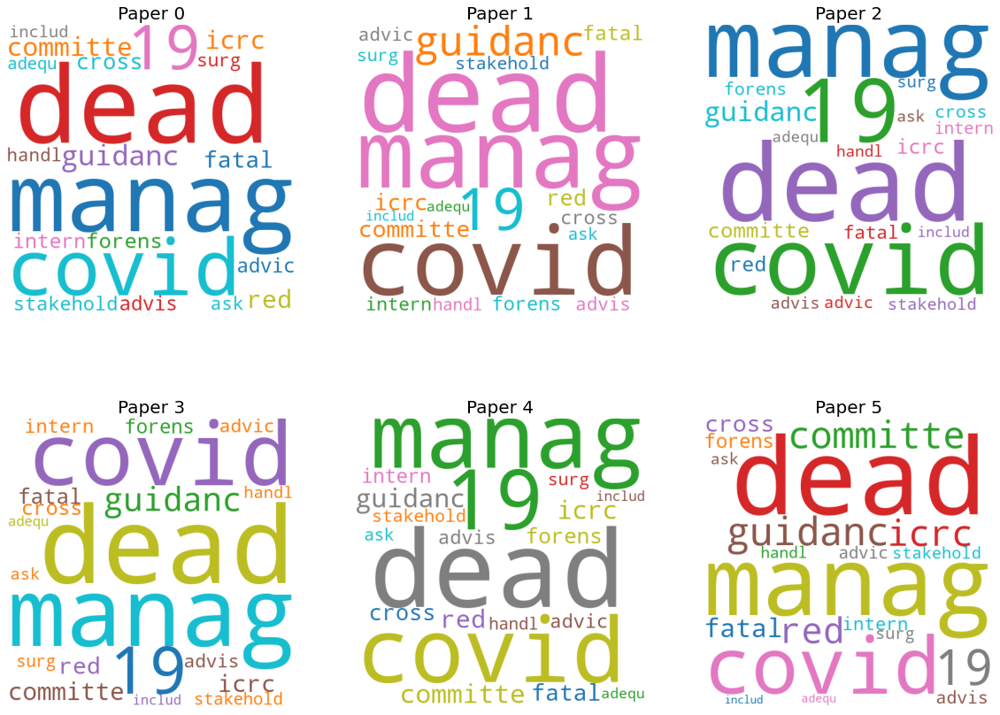

,title,doi,pmcid,pubmed_id,authors
0,Pandemic preparedness: perceptions of vulnerab...,10.1186/1471-2458-14-665,PMC4090173,2.49739e+07,"Hickey, Jason; Gagnon, Anita J; Jitthai, Nigoon"
1,Predicting support for non-pharmaceutical inte...,10.1111/disa.12089,PMC4355939,2.52435e+07,"Pillemer, Francesca Matthews; Blendon, Robert ..."
2,Effect of non-pharmaceutical interventions for...,10.1101/2020.03.03.20029843,,,Shengjie Lai; Nick W Ruktanonchai; Liangcai Zh...
3,The effectiveness of non-pharmaceutical interv...,10.1101/2020.04.06.20054197,,,Jane Cheatley; Sabine Vuik; Marion Devaux; Ste...
4,Influence of meteorological factors and air po...,10.1016/j.puhe.2006.09.023,PMC7118752,1.73072e+07,"Cai, Quan-Cai; Lu, Jian; Xu, Qin-Feng; Guo, Qi..."
5,Estimate of the development of the epidemic re...,10.1101/2020.04.04.20053637,,,Sahamoddin Khailaie; Tanmay Mitra; Arnab Bandy...


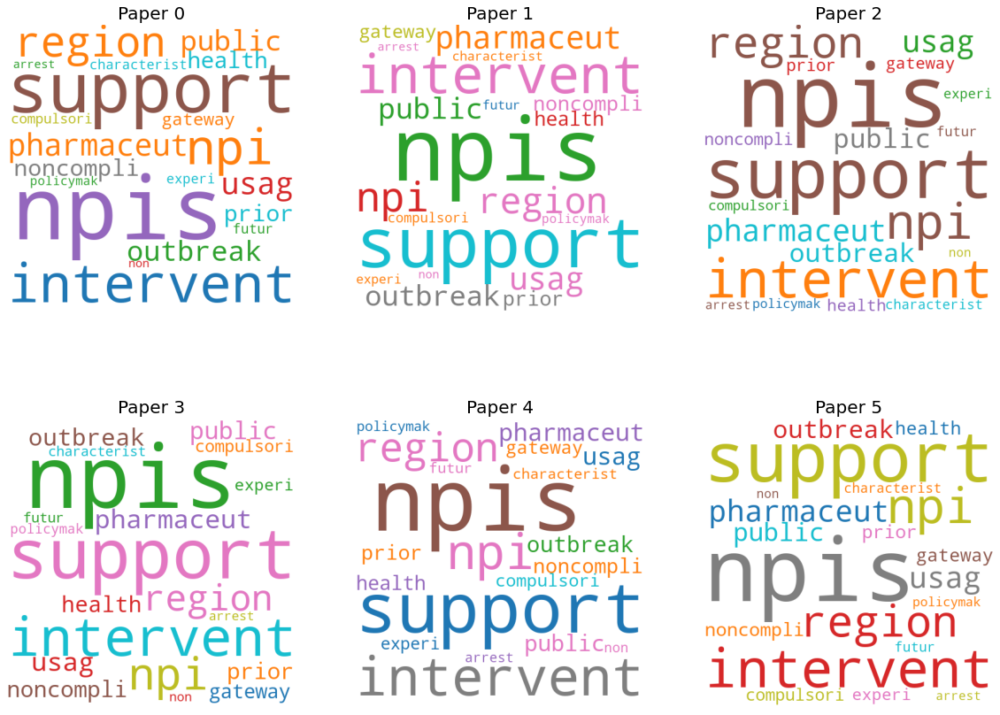

,title,doi,pmcid,pubmed_id,authors
0,Covid-19: school closures and bans on mass gat...,10.1136/bmj.m806,,3.21117e+07,"Moberly, T."
1,The effectiveness of full and partial travel b...,10.1101/2020.03.09.20032045,,,Valentina Costantino; David James Heslop; Chan...
2,The effectiveness of non-pharmaceutical interv...,10.1101/2020.04.06.20054197,,,Jane Cheatley; Sabine Vuik; Marion Devaux; Ste...
3,Ban on gain-of-function studies ends,10.1016/s1473-3099(18)30006-9,PMC7128689,2.9413e+07,"Burki, Talha"
4,Canada fury at WHO ban,10.1016/s0140-6736(03)13256-4,PMC7134940,1.27379e+07,"Kondro, Wayne"
5,Delaying the COVID-19 epidemic in Australia: E...,10.1101/2020.03.22.20041244,,,Adeshina Israel Adekunle; Michael Meehan; Dian...


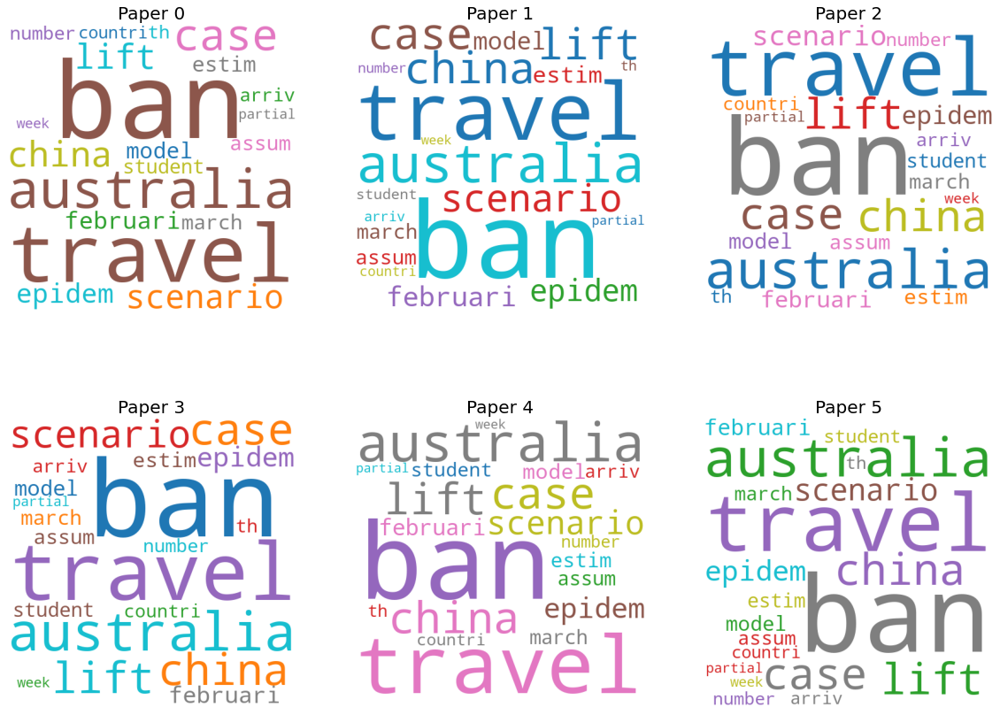

,title,doi,pmcid,pubmed_id,authors
0,Moving beyond hand hygiene monitoring as a mar...,10.1016/j.ajic.2019.06.014,PMC7115327,3.13584e+07,"Jeanes, Annette; Coen, Pietro G.; Drey, Nicola..."
1,Predictors for compliance of standard precauti...,10.1016/j.ajic.2015.03.007,PMC7115313,2.58686e+07,"Cheung, Kin; Chan, Chi Keung; Chang, Mei Yan; ..."
2,Zoonotic disease risk perceptions in the Briti...,10.1016/j.prevetmed.2016.11.015,PMC7126003,2.80109e+07,"Robin, Charlotte; Bettridge, Judy; McMaster, F..."
3,Paradoxical Increase in Methicillin-Resistant ...,10.1086/427150,PMC7107850,1.57121e+07,"Chai, Louis Y. A.; Ng, Toon Mae; Habib, Abdulr..."
4,How will this continue? Modelling interactions...,10.1101/2020.03.30.20047597,,,Axel G Rossberg; Robert J. Knell
5,Self-Reported Use of Personal Protective Equip...,10.1371/journal.pone.0044723,PMC3434157,2.29571e+07,"Hu, Xiaoyun; Zhang, Zhidan; Li, Na; Liu, Dexin..."


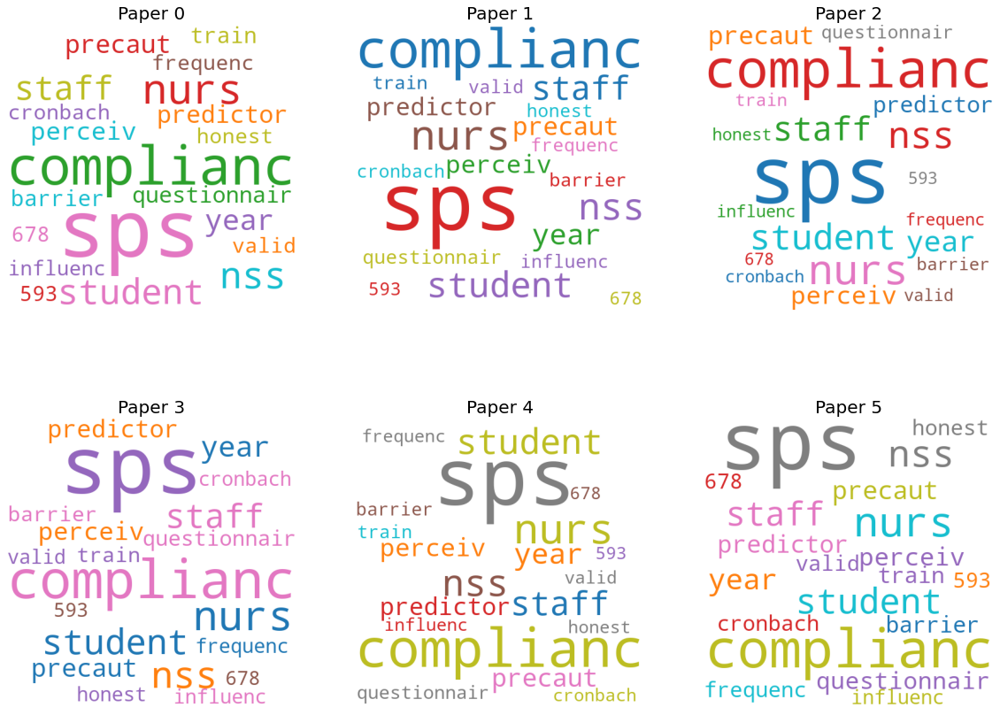

,title,doi,pmcid,pubmed_id,authors
0,Current status of therapy of SARS,10.1007/3-7643-7339-3_8,PMC7123250,,"Lau, Arthur Chun-Wing; So, Loletta Kit-Ying; Y..."
1,Beware of asymptomatic transmission: Study on ...,10.1101/2020.01.28.923169,,,Peng Shao; Yingji Shan
2,Nosocomial infection in China: Management stat...,10.1016/j.ajic.2016.01.039,PMC7135812,2.70675e+07,"Sun, Bingwei"
3,Select-agent status could slow development of ...,10.1038/nm1212-1722,PMC7096004,2.3223e+07,"Matthews, Susan"
4,Viral Hemorrhagic Fevers: Current Status of En...,10.1016/j.idc.2006.02.001,PMC7135140,1.67627e+07,"Cleri, Dennis J.; Ricketti, Anthony J.; Porwan..."
5,Development of a Nucleocapsid-Based Human Coro...,10.1128/cvi.00124-08,PMC2593164,1.89459e+07,"Severance, Emily G.; Bossis, Ioannis; Dickerso..."


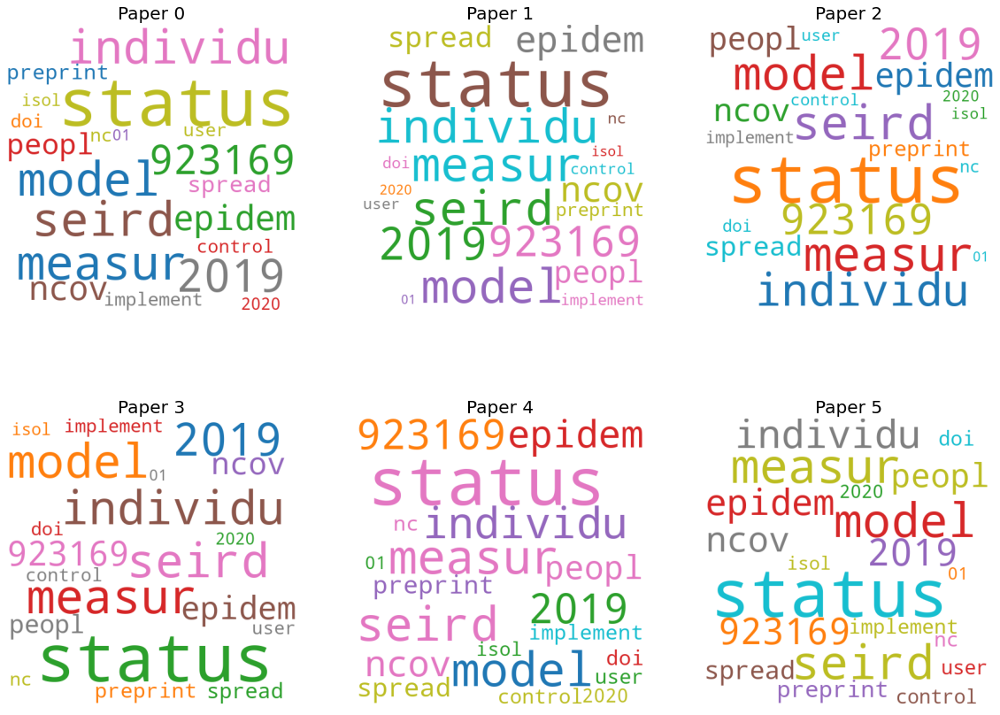

,title,doi,pmcid,pubmed_id,authors
0,The effectiveness of non-pharmaceutical interv...,10.1101/2020.04.06.20054197,,,Jane Cheatley; Sabine Vuik; Marion Devaux; Ste...
1,Rules of Engagement: The Principles of Underse...,10.1016/j.amjmed.2012.01.008,PMC7119405,2.2503e+07,"Wilson, John W.; Merry, Stephen P.; Franz, Wal..."
2,Estimate of the development of the epidemic re...,10.1101/2020.04.04.20053637,,,Sahamoddin Khailaie; Tanmay Mitra; Arnab Bandy...
3,Effect of non-pharmaceutical interventions for...,10.1101/2020.03.03.20029843,,,Shengjie Lai; Nick W Ruktanonchai; Liangcai Zh...
4,How will this continue? Modelling interactions...,10.1101/2020.03.30.20047597,,,Axel G Rossberg; Robert J. Knell
5,Modeling layered non-pharmaceutical interventi...,10.1101/2020.04.08.20058487,,,Dennis L Chao; Assaf P Oron; Devabhaktuni Srik...


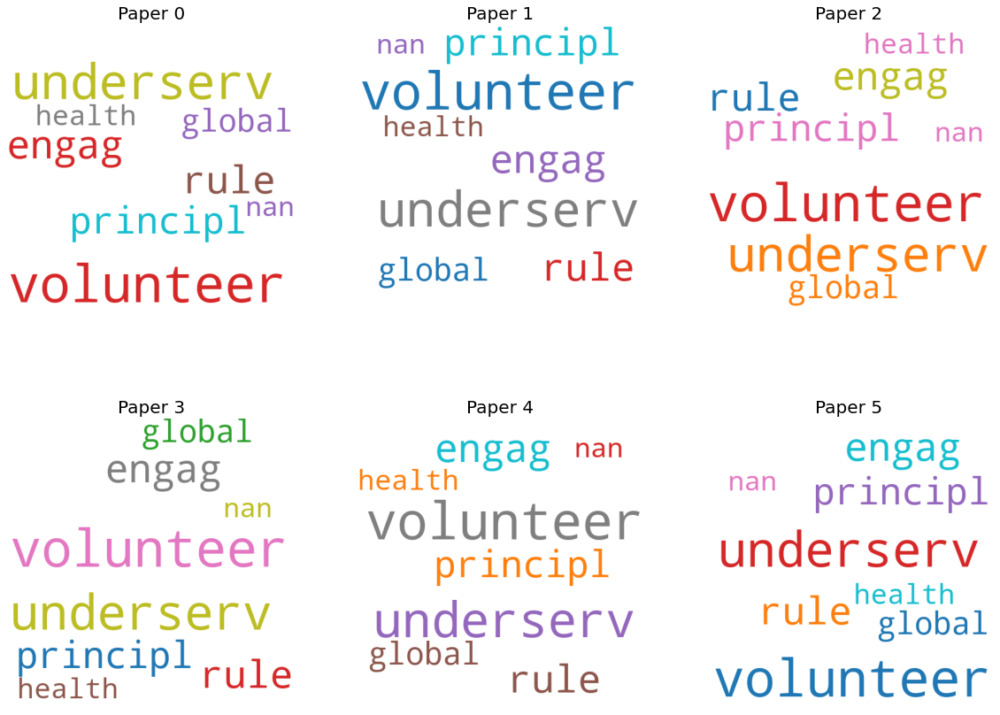

,title,doi,pmcid,pubmed_id,authors
0,Self-reported anticipated compliance with phys...,10.1186/1471-2458-10-138,PMC2847980,20233450.0,"Brown, Lawrence H; Aitken, Peter; Leggat, Pete..."
1,Employment and Compliance with Pandemic Influe...,10.3201/eid1602.090638,PMC2958001,20113549.0,"Blake, Kelly D.; Blendon, Robert J.; Viswanath..."
2,Imported malaria in the UK,10.1136/bmj.a135,PMC2453247,18599472.0,"Zuckerman, Jane N"
3,Knowledge about pandemic influenza and complia...,10.2471/blt.08.060772,PMC2733278,19705008.0,"Eastwood, Keith; Durrheim, David; Francis, J L..."
4,Pro/Con debate: Are barrier precautions cost-e...,10.1186/cc10532,PMC3396214,22264293.0,"Thampi, Nisha; Morris, Andrew M"
5,Public health measures during an anticipated i...,,PMC3270909,22312204.0,"Taylor, Melanie; Raphael, Beverley; Barr, Marg..."


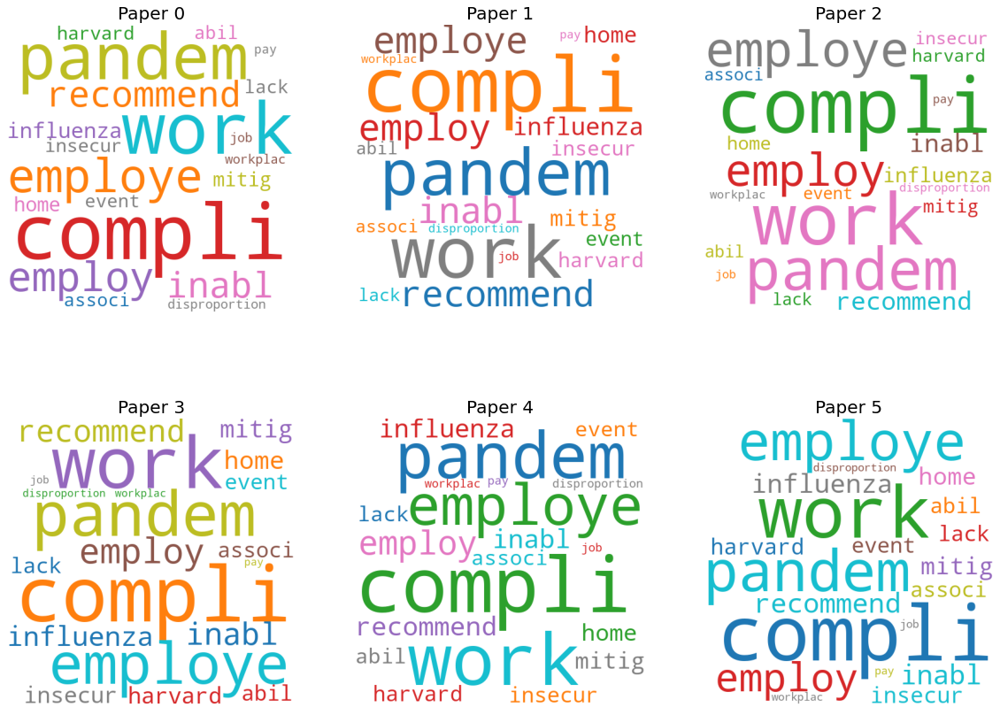

,title,doi,pmcid,pubmed_id,authors
0,SEED Servers: High-Performance Access to the S...,10.1371/journal.pone.0048053,PMC3480482,2.31102e+07,"Aziz, Ramy K.; Devoid, Scott; Disz, Terrence; ..."
1,Emergency management of nursing human resource...,10.1016/j.ijnss.2020.03.011,,,"Liu, Yu; Wang, Hui; Chen, Junhua; Zhang, Xiaoy..."
2,Wuhan and Hubei COVID-19 mortality analysis re...,10.1016/j.jinf.2020.03.018,,,"Zhang, Zuqin; Yao, Wei; Wang, Yan; Long, Cheng..."
3,Drugs supply and pharmaceutical care managemen...,10.1016/j.sapharm.2020.04.001,,,"Ying, Wang; Qian, Yu; Kun, Zhu"
4,Intensive care management of coronavirus disea...,10.1016/s2213-2600(20)30161-2,,,"Phua, Jason; Weng, Li; Ling, Lowell; Egi, Mori..."
5,A systematic review to identify areas of enhan...,10.1186/1471-2458-12-251,PMC3350431,2.24634e+07,"Prieto, Diana M; Das, Tapas K; Savachkin, Alex..."


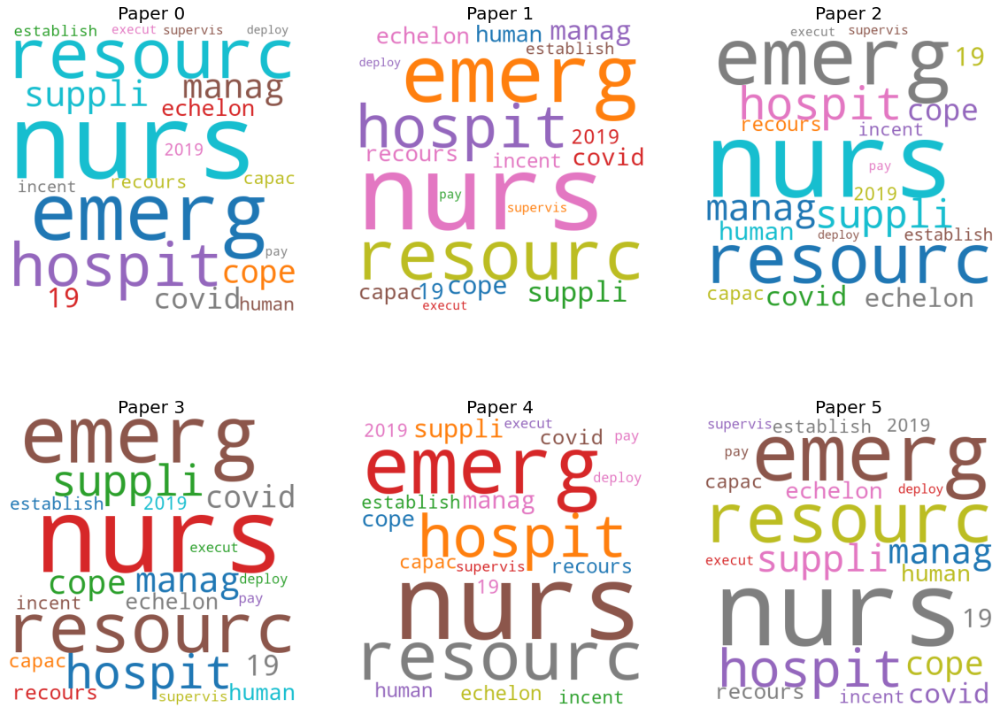

In [14]:
display_topics_results("What do we know about non-pharmaceutical interventions?")

# What has been published about medical care?

,title,doi,pmcid,pubmed_id,authors
0,Asymptomatic and Presymptomatic SARS-CoV-2 Inf...,10.15585/mmwr.mm6913e1,PMC7119514,3.22401e+07,"Kimball, Anne; Hatfield, Kelly M.; Arons, Meli..."
1,Practical Steps to Improve Air Flow in Long-Te...,10.1016/j.jamda.2020.04.001,,,"Lynch, Richard M.; Goring, Reginald"
2,Epidemiology of Covid-19 in a Long-Term Care F...,10.1056/nejmoa2005412,PMC7121761,3.22202e+07,"McMichael, Temet M.; Currie, Dustin W.; Clark,..."
3,Rhinovirus Outbreaks in Long-term Care Facilit...,10.3201/eid1609.100476,PMC3294989,2.07359e+07,"Longtin, Jean; Marchand-Austin, Alex; Winter, ..."
4,Influenza in long‐term care facilities,10.1111/irv.12464,PMC5596516,2.86912e+07,"Lansbury, Louise E.; Brown, Caroline S.; Nguye..."
5,Long-Term Care Facilities and the Coronavirus ...,10.1016/j.jamda.2020.03.004,,,"Dosa, David; Jump, Robin L.P.; LaPlante, Kerry..."


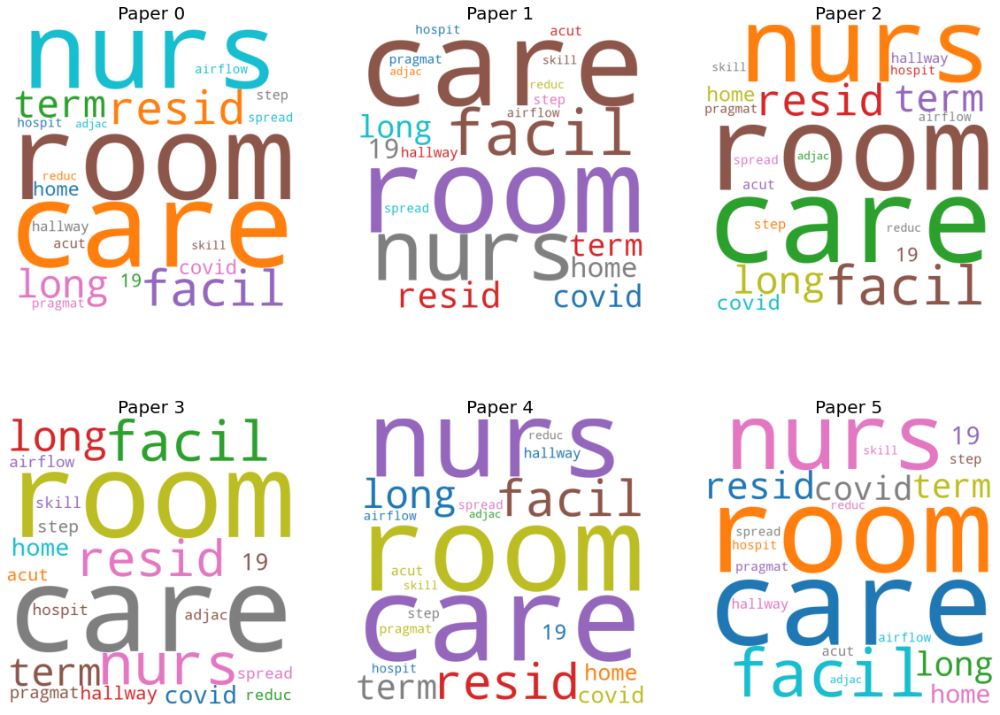

,title,doi,pmcid,pubmed_id,authors
0,Can the Health-Care System Meet the Challenge ...,,PMC1936949,1.78773e+07,"Levin, Peter J.; Gebbie, Eric N.; Qureshi, Kri..."
1,Opinion to address a potential personal protec...,10.1016/j.polymdegradstab.2020.109162,,,"Dargaville, Tim; Spann, Kirsten; Celina, Mathew"
2,Surge Capacity and Casualization: Human Resour...,10.1007/bf03405592,PMC6975992,1.68274e+07,"Baumann, Andrea O.; Blythe, Jennifer M.; Under..."
3,Intensive Care Unit Preparedness During Pandem...,10.1016/j.ccc.2019.06.001,PMC7134984,3.14456e+07,"Maves, Ryan C.; Jamros, Christina M.; Smith, A..."
4,Pandemic Influenza Planning in Nursing Homes: ...,10.1111/j.1532-5415.2007.01299.x,PMC3319394,1.77677e+07,"Mody, Lona; Cinti, Sandro"
5,"Development of a State Medical Surge Plan, Par...",10.1016/j.dmr.2005.11.001,PMC7110659,1.63606e+07,"Moser, Royce; Connelly, Colleen; Baker, Lloyd;..."


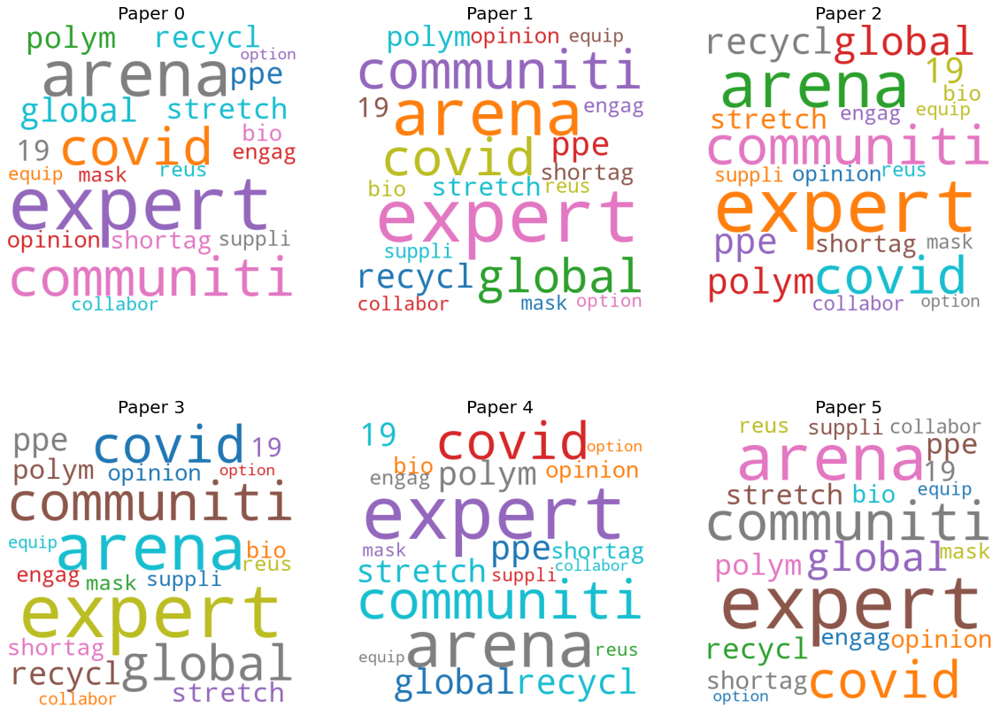

,title,doi,pmcid,pubmed_id,authors
0,The acute respiratory distress syndrome,10.1172/jci60331,PMC3408735,2.28509e+07,"Matthay, Michael A.; Ware, Lorraine B.; Zimmer..."
1,Noninvasive Mechanical Ventilation: Models to ...,10.1007/978-3-7091-1496-4_2,PMC7121120,,"Hui, David S. C."
2,Dexamethasone treatment for the acute respirat...,10.1016/s2213-2600(19)30417-5,,,"Villar, Jesús; Ferrando, Carlos; Martínez, Dom..."
3,Role of nitric oxide in management of acute re...,10.4103/1817-1737.41914,PMC2700444,1.95619e+07,"Akmal, A. H.; Hasan, Mohd"
4,A Retrospective Study Investigating Risks of A...,10.4266/kjccm.2017.00038,PMC6786705,3.17236e+07,"Hwang, Hyunjung; Kim, Yujin; Park, Jeong-Woong..."
5,Acute Respiratory Distress Syndrome,10.1007/978-981-13-3390-3_26,PMC7122525,,"Ahmad, Fawaz; Koffman, Lauren"


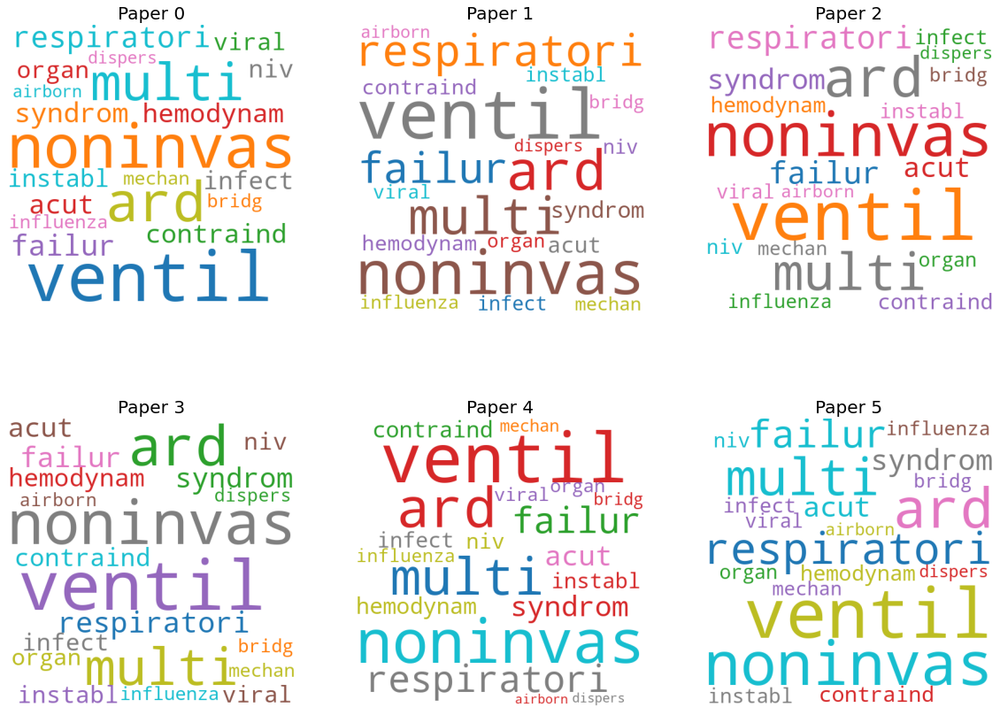

,title,doi,pmcid,pubmed_id,authors
0,Japan ECMOnet for COVID-19: telephone consulta...,10.1186/s40560-020-00440-9,PMC7136542,,
1,Management of Acute Mechanical Mitral Valve Th...,10.1053/j.jvca.2016.05.009,PMC7111610,2.75762e+07,"Callisen, Hannelisa; Sen, Ayan; Lanza, Louis; ..."
2,The answer is blowing in the wind: an uncommon...,10.1136/bcr-2016-218079,PMC5372129,2.83432e+07,"Einecke, Gunilla; Beutel, Gernot; Hoeper, Mari..."
3,Recommendations on extracorporeal life support...,10.3760/cma.j.issn.1001-0939.2020.0009,,3.20354e+07,"Chinese Society of Extracorporeal Life, Support"
4,Preparing for the Most Critically Ill Patients...,10.1001/jama.2020.2342,,3.20743e+07,"MacLaren, Graeme; Fisher, Dale; Brodie, Daniel"
5,Extracorporeal membrane oxygenation for severe...,10.1186/s13613-017-0350-x,PMC5768582,2.93307e+07,"Alshahrani, Mohammed S.; Sindi, Anees; Alshams..."


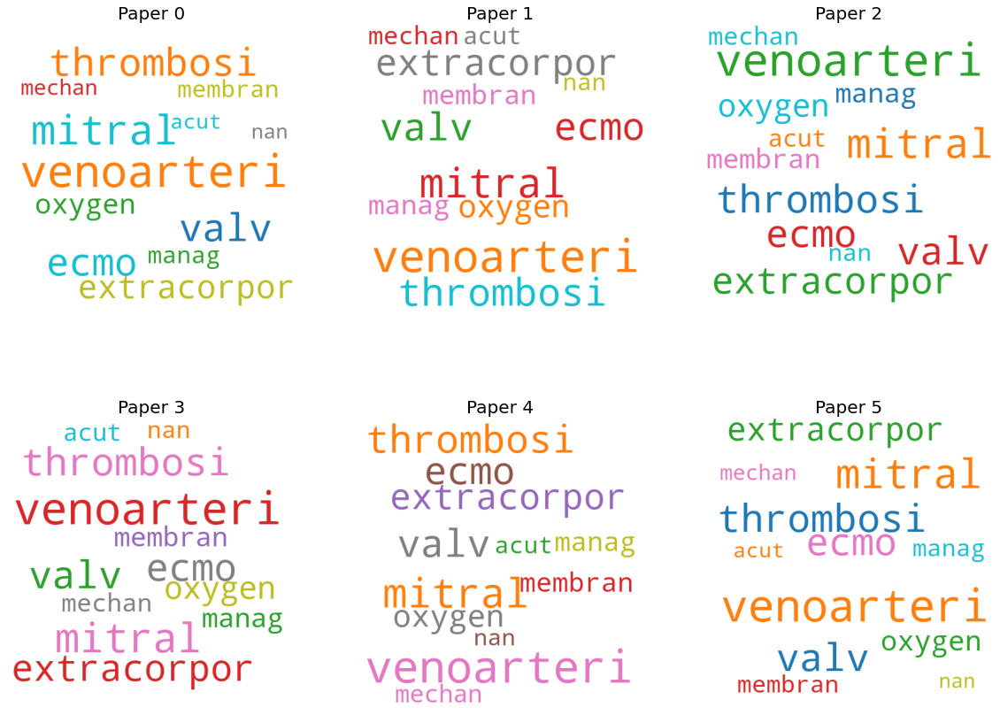

,title,doi,pmcid,pubmed_id,authors
0,The relationship of COVID-19 severity with car...,10.1101/2020.04.05.20054155,,,Kunihiro Matsushita; Ning Ding; Minghao Kou; X...
1,Reacquainting Cardiology with Mechanical Venti...,10.1016/j.jaccas.2020.03.007,,,"Gage, Ann; Higgins, Andrew; Lee, Ran; Panhwar,..."
2,Core warming of coronavirus disease 2019 (COVI...,10.1101/2020.04.03.20052001,,,Nathaniel Bonfanti; Emily Gundert; Kristina Go...
3,Level of IL-6 predicts respiratory failure in ...,10.1101/2020.04.01.20047381,,,Tobias Herold; Vindi Jurinovic; Chiara Arnreic...
4,Respiratory support for patients with COVID-19...,10.1016/s2213-2600(20)30110-7,PMC7129706,3.21458e+07,"Ñamendys-Silva, Silvio A"
5,A demographic adjustment to improve measuremen...,10.1101/2020.03.23.20040998,,,Simona Bignami; Daniela Ghio


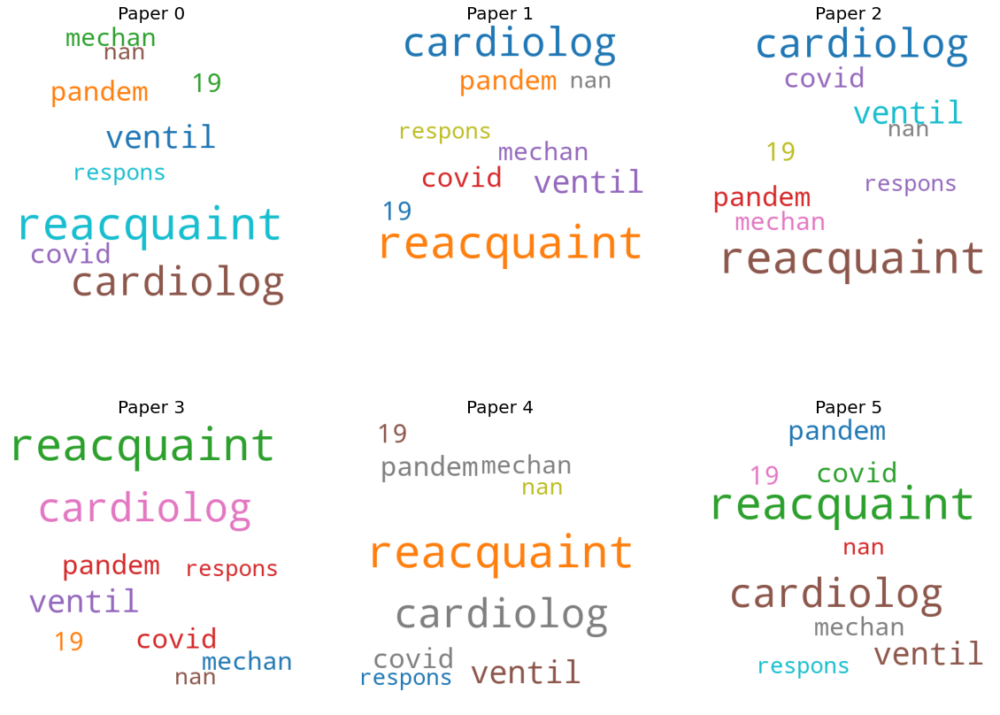

,title,doi,pmcid,pubmed_id,authors
0,COVID 19 and Intra cerebral hemorrhage: Causat...,10.1016/j.nmni.2020.100669,,,"Sharifi-Razavi, A.; Karimi, N.; Rouhani, N."
1,Cardiac manifestations of patients with COVID-...,,,,"TAN, Zhaochong; FU, Linghua; WANG, Dandan; HON..."
2,"Echo in Pandemic: Front Line Perspective, Expa...",10.1016/j.echo.2020.04.007,,,"Drake, Daniel H.; De Bonis, Michele; Covella, ..."
3,Detection of Disease Outbreaks by the Use of O...,10.1177/0022034508327546,PMC3144048,1.91313e+07,"Torres-Urquidy, M.H.; Wallstrom, G.; Schleyer,..."
4,Pediatric Mycoplasma pneumoniae Infection Pres...,10.5223/pghn.2017.20.2.124,PMC5517379,2.87301e+07,"Song, Won Jae; Kang, Ben; Lee, Hwa Pyung; Cho,..."
5,Cardiovascular disease and COVID-19,10.1016/j.dsx.2020.03.013,PMC7102662,3.22472e+07,"Bansal, Manish"


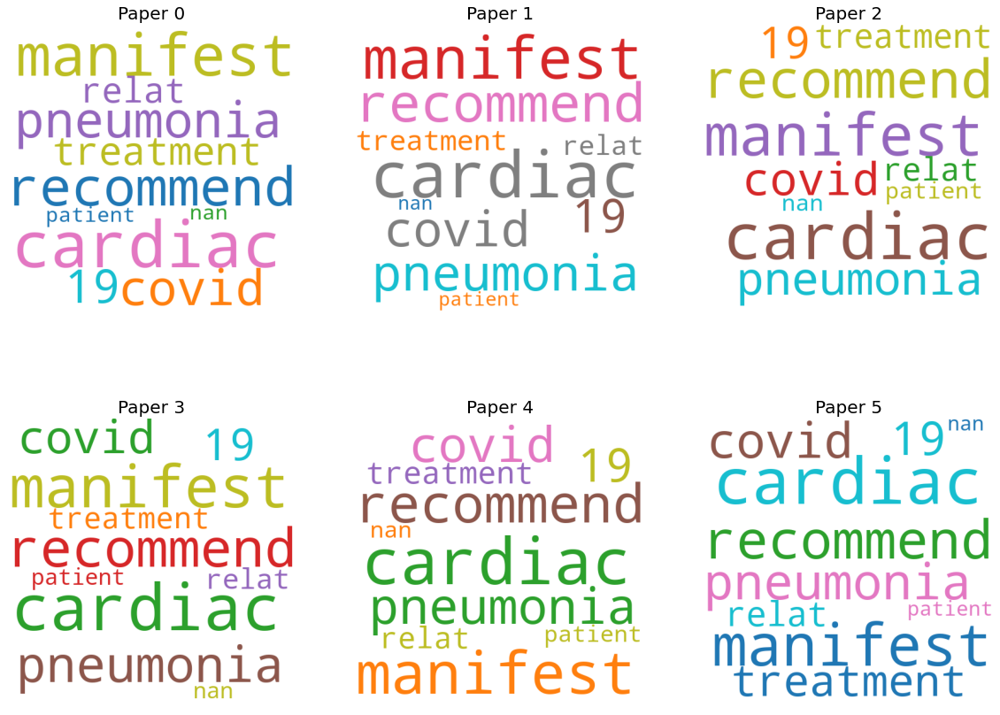

,title,doi,pmcid,pubmed_id,authors
0,Call for national dialogue: Adapting standards...,10.1016/j.colegn.2015.09.003,PMC7110603,2.9219e+07,"Cusack, Lynette; Gebbie, Kristine"
1,Considerations for Use of Investigational Drug...,10.1177/2168479016680253,PMC5486404,2.86639e+07,"Kirchoff, Matthew Carl; Pierson, Jerome F."
2,Infection Prevention for the Emergency Departm...,10.1016/j.emc.2018.06.013,PMC6203442,3.0297e+07,"Liang, Stephen Y.; Riethman, Madison; Fox, Jos..."
3,Chapter 7 Standards of Care in Pediatrics,10.1016/b978-1-4160-4889-3.00007-3,PMC7152094,,"Heider, Diane"
4,Barriers to the use of face protection for sta...,10.1016/j.ajic.2014.11.002,PMC4367448,2.55162e+07,"Kinlay, Joanne; Flaherty, Kathleen; Scanlon, P..."
5,Maintaining the quality standards of care for ...,10.1016/j.cgh.2020.04.028,,,"Allocca, Mariangela; Fiorino, Gionata; Furfaro..."


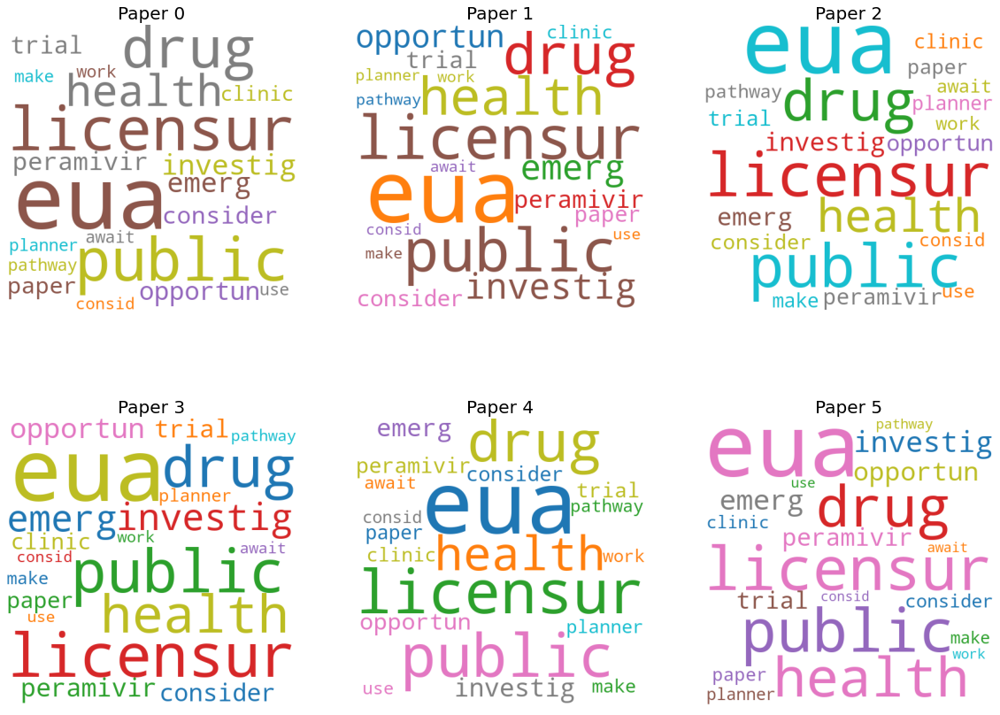

,title,doi,pmcid,pubmed_id,authors
0,Modifying reusable elastomeric respirators to ...,10.1101/2020.04.10.20061291,,,Dexter Chee Yuen Liu; Tai Hong Koo; Jackson Ka...
1,Assessment of half-mask elastomeric respirator...,10.1016/j.ajic.2017.06.034,PMC6193495,2.88444e+07,"Lawrence, Caryn; Harnish, Delbert A.; Sandoval..."
2,Reusable elastomeric air-purifying respirators...,10.1016/j.ajic.2009.11.006,PMC7115335,2.01897e+07,"Roberge, Raymond J.; Coca, Aitor; Williams, W...."
3,Effectiveness of N95 respirators versus surgic...,10.1503/cmaj.150835,PMC4868605,2.69525e+07,"Smith, Jeffrey D.; MacDougall, Colin C.; Johns..."
4,Alternative Qualitative Fit Testing Method for...,10.1101/2020.04.06.20055368,,,Destie Provenzano; Yuan James Rao; Konstantin ...
5,"Authors’ reply. MERS-CoV, surgical mask and N9...",10.11622/smedj.2014125,PMC4293956,2.52739e+07,"Chung, Jasmine Shimin; Ling, Moi Lin; Seto, Wi..."


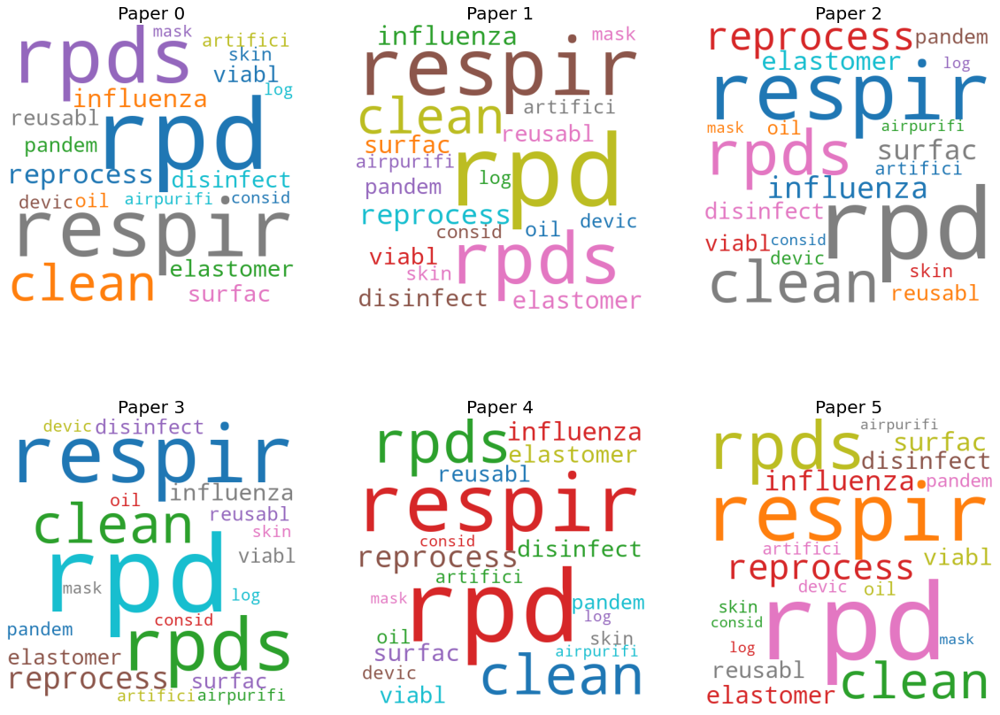

,title,doi,pmcid,pubmed_id,authors
0,Telemedicine in the Time of Coronavirus,10.1016/j.jpainsymman.2020.03.019,,,"Calton, Brook; Abedini, Nauzley; Fratkin, Michael"
1,COVID-19 and telemedicine: Immediate action re...,10.1016/j.jcv.2020.104345,,,"Moazzami, Bobak; Razavi-Khorasani, Niloofar; D..."
2,Smart home technology for telemedicine and eme...,10.1007/s12652-012-0129-8,PMC7090692,,"Li, Kin Fun"
3,From Isolation to Coordination: How Can Teleme...,10.1101/2020.02.20.20025957,,,Yunkai Zhai; Yichuan Wang; Minhao Zhang; Jody ...
4,Social media and telemedicine for oral diagnos...,10.1016/j.oraloncology.2020.104685,,,"Machado, Renato Assis; de Souza, Natália Lins;..."
5,Distance learning and telemedicine in the area...,10.1016/j.bjorl.2020.03.003,,,"Júnior, Almiro José Machado; Pauna, Henrique F..."


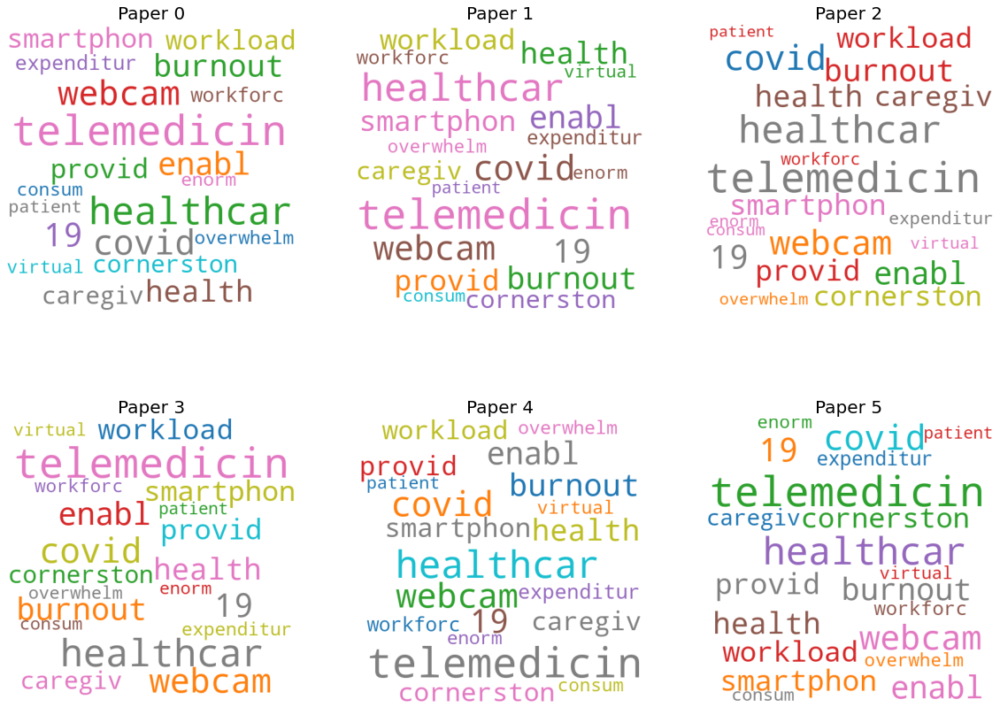

,title,doi,pmcid,pubmed_id,authors
0,COVID-19 Modelling: the Effects of Social Dist...,10.1101/2020.03.29.20046870,,,Oliva Bendtsen Cano; Sabrina Cano Morales; Cla...
1,Incidence of novel coronavirus (2019-nCoV) inf...,10.1016/j.tmaid.2020.101660,,,"Wang, Jingzhong; Liao, Yi; Wang, Xiaoyang; Li,..."
2,"Human Influenza A (H5N1) Cases, Urban Areas of...",10.3201/eid1307.061557,PMC2878233,1.82142e+07,"Yu, Hongjie; Feng, Zijian; Zhang, Xianfeng; Xi..."
3,Smart home technology for telemedicine and eme...,10.1007/s12652-012-0129-8,PMC7090692,,"Li, Kin Fun"
4,VIRAL MUTATIONS AS A POSSIBLE MECHANISM OF HID...,10.1101/2020.04.09.20059782,,,Juri Dimaschko; Victor Podolsky
5,Scientists question China’s decision not to re...,,,,Nature


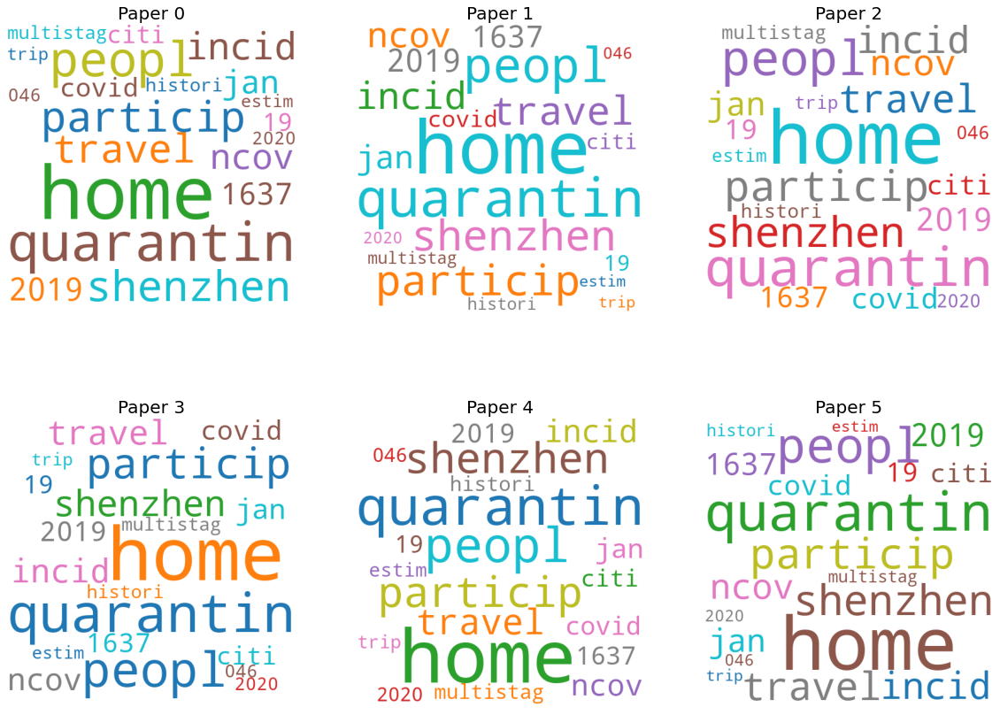

,title,doi,pmcid,pubmed_id,authors
0,COVID-19: Gastrointestinal Manifestations and ...,10.1053/j.gastro.2020.02.054,,,"Gu, Jinyang; Han, Bing; Wang, Jian"
1,Psychological intervention in oral patients in...,10.3760/cma.j.cn112144-20200213-00053,,3.20869e+07,"Qu, X.; Zhou, X. D."
2,Endodontics in Systemically Compromised Patients,10.1007/978-3-319-60997-3_12,PMC7121600,,"Wynne, Catherine"
3,Communication orale,10.1016/j.rmr.2010.10.013,,,
4,Oral Presentation Abstracts,10.1016/j.cyto.2017.09.010,,,
5,Sessions orales,10.1016/j.reaurg.2009.11.002,,,


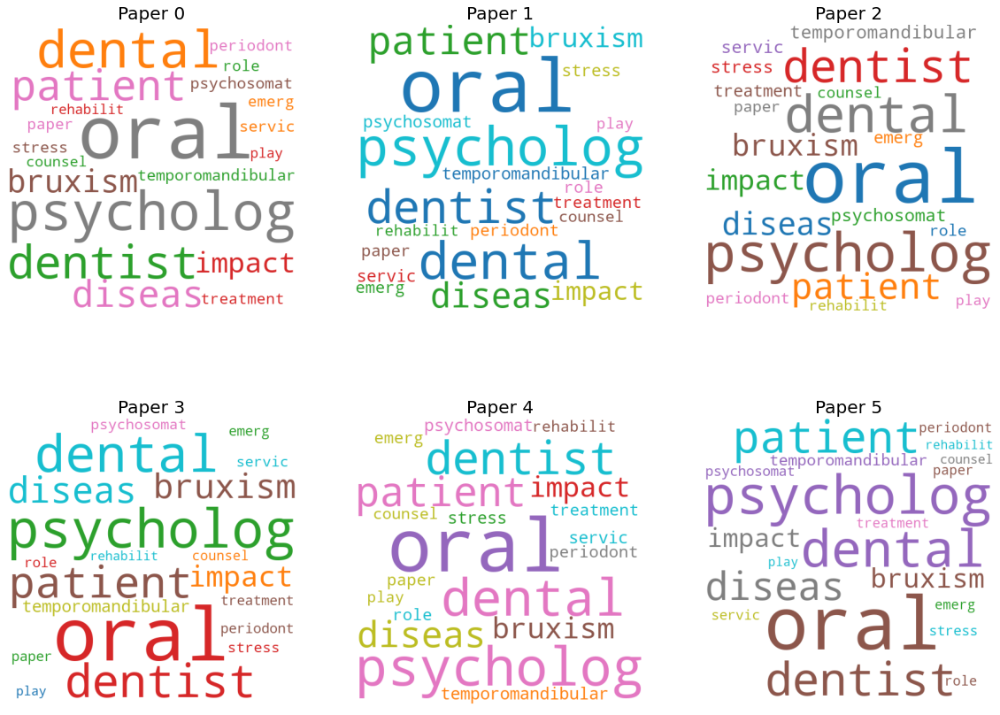

,title,doi,pmcid,pubmed_id,authors
0,The Role of Augmented Intelligence (AI) in Det...,10.1007/s10916-020-1536-6,PMC7088294,3.20204e+07,"Long, Justin B.; Ehrenfeld, Jesse M."
1,Monitoring of risk perceptions and correlates ...,10.1186/1471-2334-10-114,PMC2885389,2.04624e+07,"de Zwart, Onno; Veldhuijzen, Irene K; Richardu..."
2,Improving health aid for a better planet: The ...,10.7189/jogh.05.020404,PMC4544236,2.63222e+07,"Sridhar, Devi; Car, Josip; Chopra, Mickey; Cam..."
3,"The Assessment, Evaluation, and Management of ...",10.1055/s-0036-1584672,PMC6260260,3.10734e+07,"Tang, Swee Fong; Lum, Lucy"
4,Artificial intelligence finds drugs that could...,10.1021/cen-09806-scicon1,,,
5,Artificial Intelligence Applications in Tracki...,10.1007/978-3-030-35139-7_7,PMC7123557,,"Ganasegeran, Kurubaran; Abdulrahman, Surajudee..."


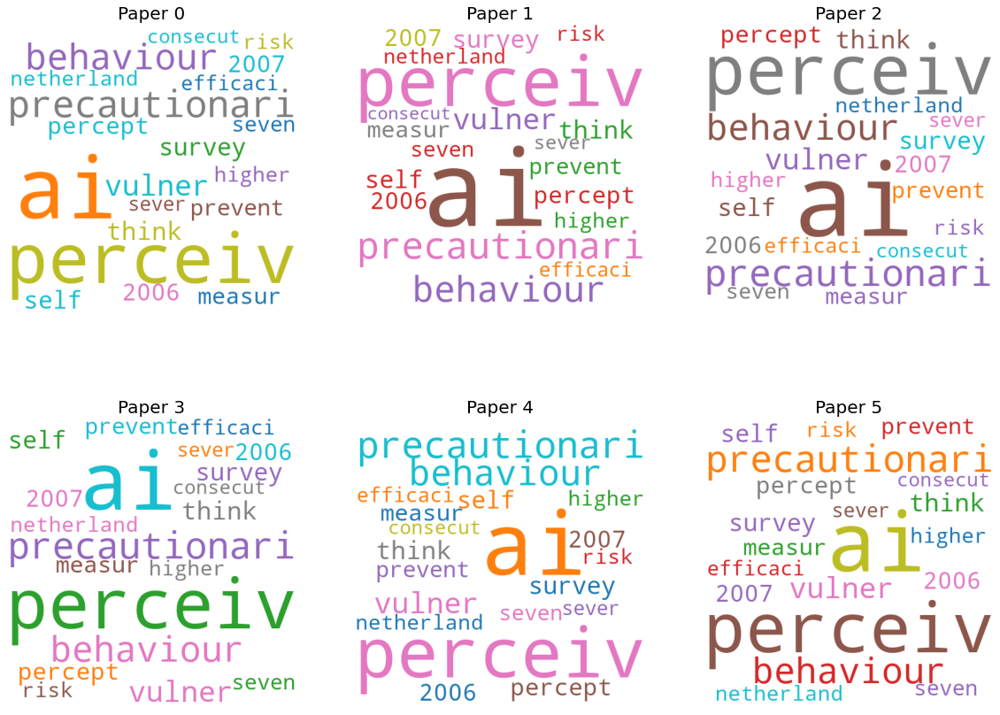

,title,doi,pmcid,pubmed_id,authors
0,Beyond Disaster Preparedness: Building a Resil...,10.3390/ijerph14121563,PMC5750981,2.9236e+07,"Madrigano, Jaime; Chandra, Anita; Costigan, Tr..."
1,Simulation and Modeling Applications in Global...,10.1007/978-3-030-23491-1_13,PMC7123972,,"French, Arthur J."
2,COVID-19: Global radiation oncology’s targeted...,10.1016/j.ctro.2020.03.009,PMC7102593,,"Simcock, Richard; Thomas, Toms Vengaloor; Este..."
3,The potential impact of the next influenza pan...,10.1186/1478-4491-3-7,PMC1215505,1.6093e+07,"Wilson, Nick; Baker, Michael; Crampton, Peter;..."
4,Using Blended Learning In Training The Public ...,,PMC1525268,1.6529e+07,"Moore, Gary S; Perlow, Audrey; Judge, Christin..."
5,Supporting the Health Care Workforce During th...,10.1001/jama.2020.3972,,,"Adams, James G.; Walls, Ron M."


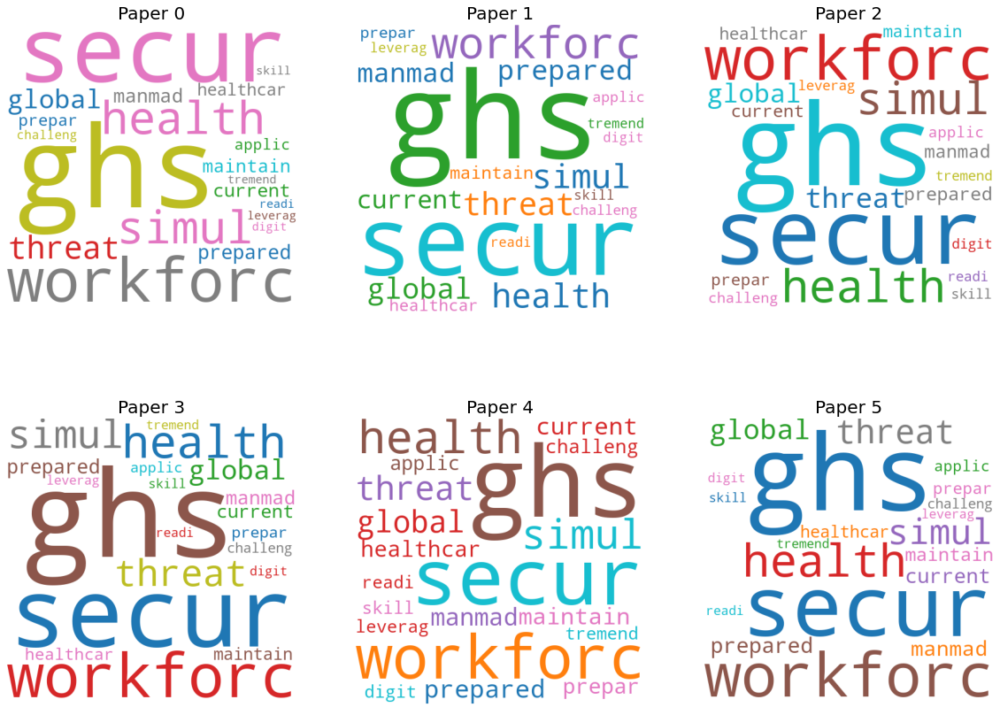

,title,doi,pmcid,pubmed_id,authors
0,Epidemiologic data and pathogen genome sequenc...,10.1186/s13059-014-0538-4,PMC4282151,2.54181e+07,"Grad, Yonatan H; Lipsitch, Marc"
1,Ongoing Clinical Trials for the Management of ...,10.1016/j.tips.2020.03.006,,,"Lythgoe, Mark P.; Middleton, Paul"
2,What Have We Learned About Middle East Respira...,10.1089/vbz.2017.2191,PMC6396572,3.06763e+07,"Dawson, Patrick; Malik, Mamunur Rahman; Parvez..."
3,Advance of Novel Coronavirus Registration Clin...,10.1101/2020.03.16.20034934,,,gao song; meng qun cheng; xian wen wei
4,The globalization of emergency medicine and it...,,PMC2627492,1.71284e+07,"Anderson, Philip; Petrino, Roberta; Halpern, P..."
5,Emerging infectious disease laboratory and dia...,10.1080/21645515.2019.1634992,PMC6816404,3.12684e+07,"Roberts, Christine C."


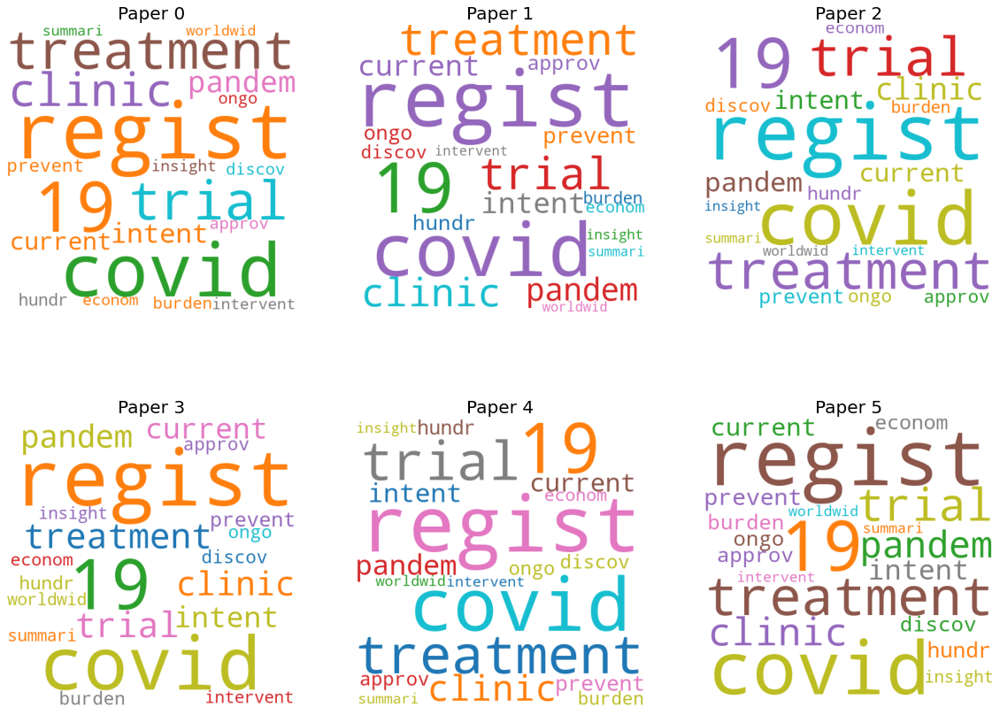

,title,doi,pmcid,pubmed_id,authors
0,A Web-Based System for Infectious Disease Data...,10.1007/978-3-540-72608-1_13,PMC7122142,,"Hu, Paul Jen-Hwa; Zeng, Daniel; Chen, Hsinchun..."
1,Core Minimal Datasets to Advance Clinical Rese...,10.1093/cid/ciz760,PMC7108131,3.1407e+07,"Rojek, Amanda M; Moran, James; Horby, Peter W"
2,Core Outcome Set for Clinical Trials on Corona...,10.1016/j.eng.2020.03.002,,,"Jin, Xinyao; Pang, Bo; Zhang, Junhua; Liu, Qin..."
3,Integration of patient-reported outcomes in mu...,10.1016/j.cct.2013.02.006,PMC7105971,2.34156e+07,"Gnanasakthy, Ari; DeMuro, Carla; Boulton, Caro..."
4,A Real-Time Autonomous Dashboard for the Emerg...,10.2196/10666,PMC6284143,3.04671e+07,"Yoo, Junsang; Jung, Kwang Yul; Kim, Taerim; Le..."
5,Short-term outcome of critically ill patients ...,10.1007/s00134-003-2143-y,PMC7080204,1.47402e+07,"Gomersall, Charles D.; Joynt, Gavin M.; Lam, P..."


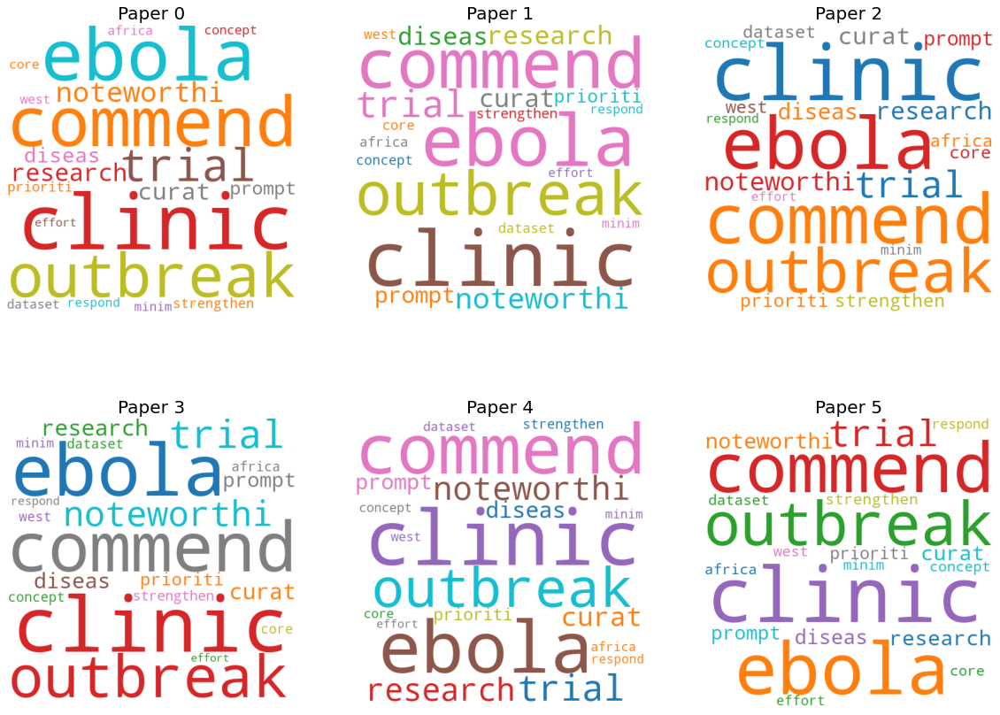

,title,doi,pmcid,pubmed_id,authors
0,Severe varicella-zoster virus pneumonia: a mul...,10.1186/s13054-017-1731-0,PMC5463395,28592328.0,"Mirouse, Adrien; Vignon, Philippe; Piron, Pres..."
1,Host-directed therapies for infectious disease...,10.1016/s1473-3099(16)00078-5,,27036359.0,"Zumla, Alimuddin; Rao, Martin; Wallis, Robert ..."
2,Severe Acute Respiratory Syndrome: Clinical Ou...,10.3201/eid0909.030362,PMC3016795,14519241.0,"Tsui, Ping Tim; Kwok, Man Leung; Yuen, Hon; La..."
3,Prevention of influenza in healthy children,10.1586/eri.12.106,PMC3763239,23199400.0,"Lee, Bruce Y; Shah, Mirat"
4,Complementary and alternative medicine for the...,10.1371/journal.pone.0172289,PMC5315308,28212381.0,"Kua, Kok Pim; Lee, Shaun Wen Huey"
5,Successful steroid treatment for acute fibrino...,10.12998/wjcc.v6.i15.1053,PMC6288515,30568963.0,"Ning, Ya-Jing; Ding, Pei-Shan; Ke, Zhang-Yan; ..."


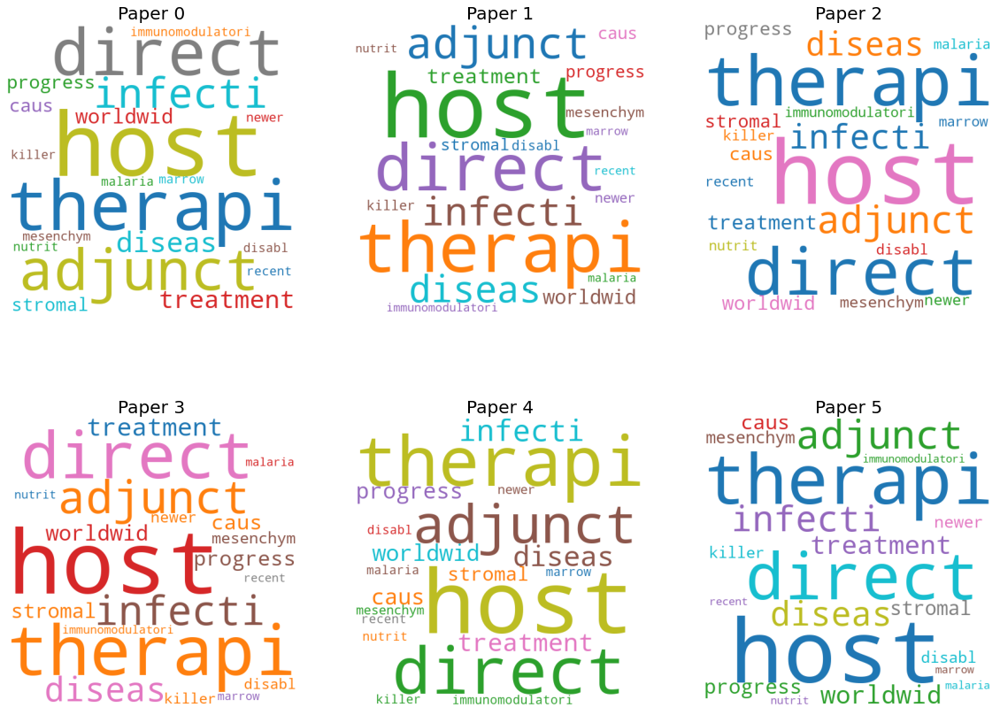

In [15]:
display_topics_results("What has been published about medical care?")